# Comprehensive WSI (Whole Slide Imaging) Processing Tutorial

This notebook provides a detailed walkthrough of working with Whole Slide Images (WSI) using HoneyBee's advanced processing capabilities. We'll cover:

1. **WSI Loading Basics** - Understanding multi-resolution pyramids and efficient data access
2. **Tissue Detection** - Classical and deep learning approaches for identifying tissue regions
3. **Stain Normalization** - Reducing color variations across slides for consistent analysis
4. **Stain Separation** - Analyzing individual stain components (H&E) for quantitative analysis

## Prerequisites

- HoneyBee framework installed
- OpenSlide system dependency
- CUDA-capable GPU (optional but recommended)
- Sample WSI file (e.g., TCGA slide in .svs format)

In [1]:
# Setup and imports
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import json
import time
from typing import List, Dict, Tuple

# Add HoneyBee to path if needed
honeybee_path = os.path.abspath(os.path.join(os.getcwd(), '../..'))
if honeybee_path not in sys.path:
    sys.path.append(honeybee_path)

# HoneyBee imports
from honeybee.loaders.Slide.slide import Slide
from honeybee.models.TissueDetector.tissue_detector import TissueDetector
from honeybee.preprocessing.stain_normalization import (
    ReinhardNormalizer, MacenkoNormalizer, VahadaneNormalizer,
    ColorAugmenter
)

# Computer vision imports
import cv2
from skimage.color import rgb2hed, hed2rgb
from skimage.filters import threshold_otsu
from skimage.morphology import remove_small_objects, binary_closing, disk
from scipy.ndimage import sobel

# Visualization settings
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['figure.dpi'] = 100

print("HoneyBee WSI Tutorial Environment Loaded")
print(f"NumPy version: {np.__version__}")
print(f"Working directory: {os.getcwd()}")

HoneyBee WSI Tutorial Environment Loaded
NumPy version: 1.26.4
Working directory: /mnt/f/Projects/HoneyBee/examples/wsi


In [3]:
# Configuration - Update these paths for your environment
WSI_PATH = "/mnt/f/Projects/HoneyBee/examples/samples/sample.svs"  # Update this
TISSUE_DETECTOR_PATH = "/mnt/d/Models/TissueDetector/HnE.pt"  # Update this
OUTPUT_DIR = "./wsi_tutorial_outputs"

# Create output directory
os.makedirs(OUTPUT_DIR, exist_ok=True)
print(f"Output directory: {OUTPUT_DIR}")

# Check if files exist
if not os.path.exists(WSI_PATH):
    print("Warning: WSI file not found. Please update WSI_PATH.")
if not os.path.exists(TISSUE_DETECTOR_PATH):
    print("Warning: Tissue detector model not found. Please update TISSUE_DETECTOR_PATH.")

Output directory: ./wsi_tutorial_outputs


# Part 1: WSI Loading Basics

Whole Slide Images are massive multi-resolution images that can be several gigabytes in size. They are stored as pyramids with multiple resolution levels, allowing efficient access at different magnifications.

## Key Concepts:
- **Multi-resolution pyramid**: Multiple versions of the image at different resolutions
- **Levels**: Each pyramid level represents a different magnification (level 0 = highest resolution)
- **Tiles/Patches**: Small regions that can be loaded independently
- **Memory efficiency**: Only load what you need, when you need it

In [4]:
# Load WSI with basic settings
print("Loading WSI...")
start_time = time.time()

slide = Slide(
    WSI_PATH, 
    visualize=False,  # Don't create visualizations during loading
    max_patches=100,  # Limit patches for faster loading
    verbose=True      # Show loading progress
)

load_time = time.time() - start_time
print(f"\nWSI loaded in {load_time:.2f} seconds")

Loading WSI...
Resolutions: {'level_count': 3, 'level_dimensions': ((27965, 25146), (6991, 6286), (1747, 1571)), 'level_downsamples': (1.0, 4.00023078918457, 16.00690269470215), 'level_tile_sizes': ((240, 240), (240, 240), (240, 240))}
Level 0: 54x49 (2646) 	 Resolution: 27965x25146
Level 1: 13x12 (156) 	 Resolution: 6991x6286
Level 2: 3x3 (9) 	 Resolution: 1747x1571
Selected level 2 with dimensions: 1571x1747

WSI loaded in 0.05 seconds


In [5]:
# Explore WSI metadata
resolutions = slide.img.resolutions
metadata = slide.img.metadata

print("=== WSI Properties ===")
print(f"Current level dimensions: {slide.slide.width} x {slide.slide.height}")
print(f"Number of pyramid levels: {resolutions['level_count']}")
print(f"\nPyramid structure:")

# Display pyramid levels
for level in range(resolutions['level_count']):
    dims = resolutions['level_dimensions'][level]
    downsample = resolutions['level_downsamples'][level]
    size_mb = (dims[0] * dims[1] * 3) / (1024 * 1024)  # Approximate uncompressed size
    print(f"  Level {level}: {dims[0]:,} x {dims[1]:,} pixels, "
          f"downsample: {downsample:.1f}x, ~{size_mb:.1f} MB uncompressed")

# Vendor-specific metadata
if 'aperio' in metadata:
    aperio = metadata['aperio']
    print(f"\n=== Scanner Information ===")
    print(f"Scanner: {aperio.get('ScanScope ID', 'Unknown')}")
    print(f"Objective magnification: {aperio.get('AppMag', 'Unknown')}x")
    print(f"Microns per pixel: {aperio.get('MPP', 'Unknown')}")
    print(f"Scan date: {aperio.get('Date', 'Unknown')}")

=== WSI Properties ===
Current level dimensions: 1747 x 1571
Number of pyramid levels: 3

Pyramid structure:
  Level 0: 27,965 x 25,146 pixels, downsample: 1.0x, ~2011.9 MB uncompressed
  Level 1: 6,991 x 6,286 pixels, downsample: 4.0x, ~125.7 MB uncompressed
  Level 2: 1,747 x 1,571 pixels, downsample: 16.0x, ~7.9 MB uncompressed

=== Scanner Information ===
Scanner: SS1258
Objective magnification: 20x
Microns per pixel: 0.5001
Scan date: 01/15/08


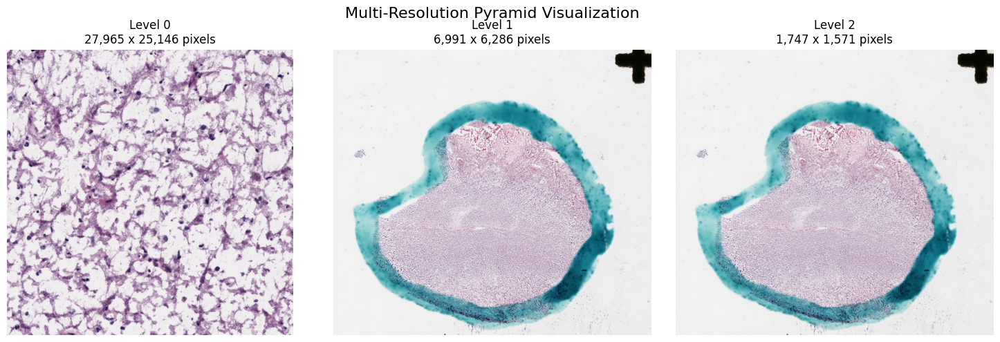

In [6]:
# Visualize multi-resolution pyramid
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle('Multi-Resolution Pyramid Visualization', fontsize=16)

# Load and display first 3 pyramid levels
for i in range(min(3, resolutions['level_count'])):
    level_dims = resolutions['level_dimensions'][i]
    
    # For level 0, read a small region; for others, read entire level
    if i == 0:
        # Read 1000x1000 region from center
        center = (level_dims[0] // 2, level_dims[1] // 2)
        size = (1000, 1000)
        location = (center[0] - size[0]//2, center[1] - size[1]//2)
    else:
        location = (0, 0)
        size = level_dims
    
    # Read region
    region = slide.img.read_region(location, size, i)
    img_array = np.asarray(region)
    
    # Display
    axes[i].imshow(img_array)
    axes[i].set_title(f'Level {i}\n{level_dims[0]:,} x {level_dims[1]:,} pixels')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

=== Efficient Region Reading ===
Level 0: Shape=(2000, 2000, 3), Time=0.024s
Level 1: Shape=(2000, 2000, 3), Time=0.050s
Level 2: Shape=(2000, 2000, 3), Time=0.028s


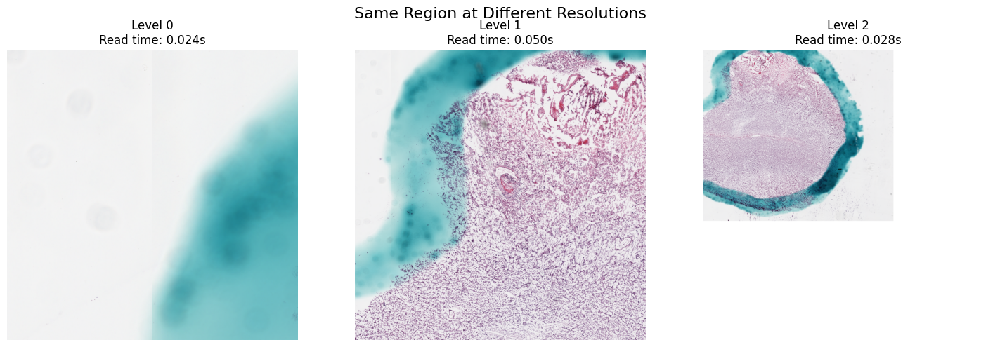

In [7]:
# Demonstrate efficient region reading
print("=== Efficient Region Reading ===")

# Define region of interest
roi_size = (2000, 2000)
level0_dims = resolutions['level_dimensions'][0]
roi_location = (level0_dims[0] // 4, level0_dims[1] // 4)  # Upper-left quadrant

# Read same region at different resolutions
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle('Same Region at Different Resolutions', fontsize=16)

for i, level in enumerate([0, 1, 2]):
    if level >= resolutions['level_count']:
        continue
        
    start = time.time()
    region = slide.img.read_region(roi_location, roi_size, level)
    read_time = time.time() - start
    
    img_array = np.asarray(region)
    
    axes[i].imshow(img_array)
    axes[i].set_title(f'Level {level}\nRead time: {read_time:.3f}s')
    axes[i].axis('off')
    
    print(f"Level {level}: Shape={img_array.shape}, Time={read_time:.3f}s")

plt.tight_layout()
plt.show()

Generating WSI thumbnail...


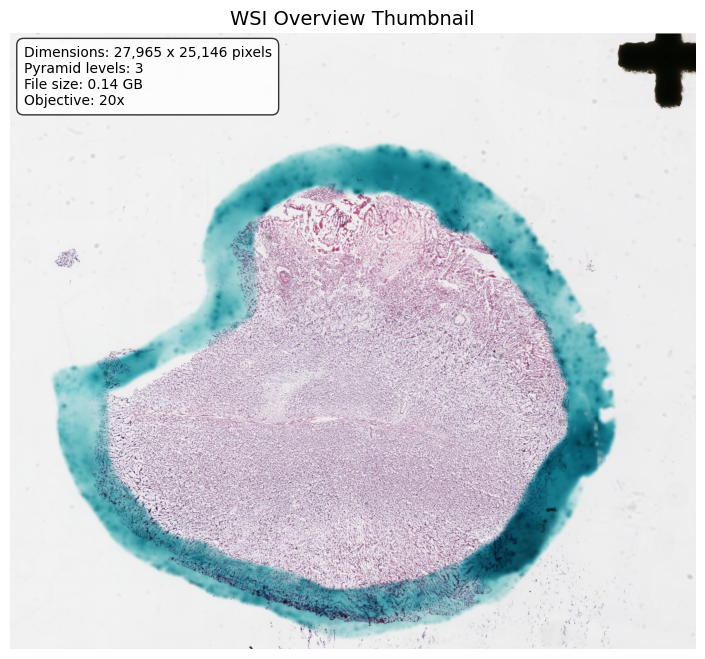

Thumbnail saved to: ./wsi_tutorial_outputs/wsi_thumbnail.png


In [8]:
# Generate and display thumbnail
print("Generating WSI thumbnail...")

# Use lowest resolution level for thumbnail
last_level = resolutions['level_count'] - 1
last_dims = resolutions['level_dimensions'][last_level]

# Read entire lowest resolution
thumbnail = slide.img.read_region([0, 0], last_dims, last_level)
thumb_array = np.asarray(thumbnail)

# Display with metadata overlay
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(thumb_array)
ax.set_title('WSI Overview Thumbnail', fontsize=14)
ax.axis('off')

# Add metadata text
info_text = f"""Dimensions: {level0_dims[0]:,} x {level0_dims[1]:,} pixels
Pyramid levels: {resolutions['level_count']}
File size: {os.path.getsize(WSI_PATH) / (1024**3):.2f} GB
Objective: {metadata.get('aperio', {}).get('AppMag', 'N/A')}x"""

ax.text(0.02, 0.98, info_text, transform=ax.transAxes, 
        bbox=dict(boxstyle="round,pad=0.5", facecolor="white", alpha=0.8),
        verticalalignment='top', fontsize=10)

plt.show()

# Save thumbnail
thumb_path = os.path.join(OUTPUT_DIR, "wsi_thumbnail.png")
Image.fromarray(thumb_array).save(thumb_path)
print(f"Thumbnail saved to: {thumb_path}")

# Part 2: Tissue Detection

Tissue detection is crucial for WSI analysis as slides contain large areas of background (glass) that don't contain tissue. Efficient tissue detection allows us to:
- Focus computational resources on relevant regions
- Reduce storage and processing requirements
- Improve downstream analysis accuracy

We'll explore two approaches:
1. **Classical Method**: Otsu thresholding with morphological operations
2. **Deep Learning**: Pre-trained CNN for tissue/background/artifact classification

In [9]:
# Classical tissue detection function
def classical_tissue_detection(image: np.ndarray, min_object_size: int = 1000) -> np.ndarray:
    """
    Detect tissue using classical computer vision techniques.
    
    Steps:
    1. Convert to grayscale
    2. Compute gradient magnitude (edges)
    3. Apply Otsu's threshold
    4. Clean up with morphological operations
    """
    # Convert to grayscale
    gray = np.mean(image.astype(np.float32), axis=2)
    
    # Compute gradients
    grad_x = sobel(gray, axis=1)
    grad_y = sobel(gray, axis=0)
    magnitude = np.sqrt(grad_x**2 + grad_y**2)
    
    # Threshold
    threshold = threshold_otsu(magnitude)
    tissue_mask = magnitude > threshold
    
    # Morphological cleanup
    tissue_mask = binary_closing(tissue_mask, disk(5))
    tissue_mask = remove_small_objects(tissue_mask, min_size=min_object_size)
    
    return tissue_mask

In [10]:
# Load a fresh slide for tissue detection comparison
print("Loading slide without tissue detection...")
slide_no_detection = Slide(WSI_PATH, visualize=False, max_patches=1000, verbose=False)

# Get low resolution image for classical detection
detection_level = min(2, resolutions['level_count'] - 1)
level_dims = resolutions['level_dimensions'][detection_level]

print(f"Using level {detection_level} for tissue detection ({level_dims[0]} x {level_dims[1]})")

# Read low resolution image
low_res_image = np.asarray(
    slide_no_detection.img.read_region([0, 0], level_dims, detection_level)
)

Loading slide without tissue detection...
Using level 2 for tissue detection (1747 x 1571)


In [11]:
# Perform classical tissue detection
print("Performing classical tissue detection...")
start_time = time.time()

classical_mask = classical_tissue_detection(low_res_image, min_object_size=100)

classical_time = time.time() - start_time
print(f"Classical detection completed in {classical_time:.2f}s")

# Calculate statistics
tissue_pixels = np.sum(classical_mask)
total_pixels = classical_mask.size
tissue_percentage = (tissue_pixels / total_pixels) * 100

print(f"\nClassical Detection Results:")
print(f"  Tissue pixels: {tissue_pixels:,}")
print(f"  Total pixels: {total_pixels:,}")
print(f"  Tissue percentage: {tissue_percentage:.2f}%")

Performing classical tissue detection...
Classical detection completed in 0.20s

Classical Detection Results:
  Tissue pixels: 932,213
  Total pixels: 2,744,537
  Tissue percentage: 33.97%


In [12]:
# Load tissue detector model and perform deep learning detection
print("\nLoading deep learning tissue detector...")
tissue_detector = TissueDetector(model_path=TISSUE_DETECTOR_PATH)

# Load slide with tissue detection
print("Loading slide with deep learning tissue detection...")
start_time = time.time()

slide_with_detection = Slide(
    WSI_PATH, 
    visualize=False, 
    tile_size=512,
    max_patches=1000,
    tissue_detector=tissue_detector,
    verbose=True
)

deep_time = time.time() - start_time
print(f"\nDeep learning detection completed in {deep_time:.2f}s")


Loading deep learning tissue detector...
Loading slide with deep learning tissue detection...
Resolutions: {'level_count': 3, 'level_dimensions': ((27965, 25146), (6991, 6286), (1747, 1571)), 'level_downsamples': (1.0, 4.00023078918457, 16.00690269470215), 'level_tile_sizes': ((240, 240), (240, 240), (240, 240))}
Level 0: 54x49 (2646) 	 Resolution: 27965x25146
Level 1: 13x12 (156) 	 Resolution: 6991x6286
Selected level 1 with dimensions: 6286x6991

Deep learning detection completed in 1.12s


In [13]:
# Analyze deep learning results
tissue_tiles = 0
background_tiles = 0
artifact_tiles = 0
tissue_coords = []

# The tissue detector classifies each tile as:
# 0: Artifact, 1: Background, 2: Tissue
tissue_confidence_threshold = 0.8

for address in slide_with_detection.iterateTiles():
    tile_info = slide_with_detection.tileDictionary[address]
    
    if 'tissueLevel' in tile_info:
        tissue_level = tile_info['tissueLevel']
        
        if tissue_level >= tissue_confidence_threshold:
            tissue_tiles += 1
            tissue_coords.append((tile_info['x'], tile_info['y']))
        elif tile_info.get('backgroundLevel', 0) > tile_info.get('artifactLevel', 0):
            background_tiles += 1
        else:
            artifact_tiles += 1

total_tiles = len(slide_with_detection.tileDictionary)

print("\nDeep Learning Detection Results:")
print(f"  Total tiles analyzed: {total_tiles}")
print(f"  Tissue tiles (>{tissue_confidence_threshold*100:.0f}% conf): {tissue_tiles} ({tissue_tiles/total_tiles*100:.1f}%)")
print(f"  Background tiles: {background_tiles} ({background_tiles/total_tiles*100:.1f}%)")
print(f"  Artifact tiles: {artifact_tiles} ({artifact_tiles/total_tiles*100:.1f}%)")


Deep Learning Detection Results:
  Total tiles analyzed: 156
  Tissue tiles (>80% conf): 46 (29.5%)
  Background tiles: 66 (42.3%)
  Artifact tiles: 44 (28.2%)


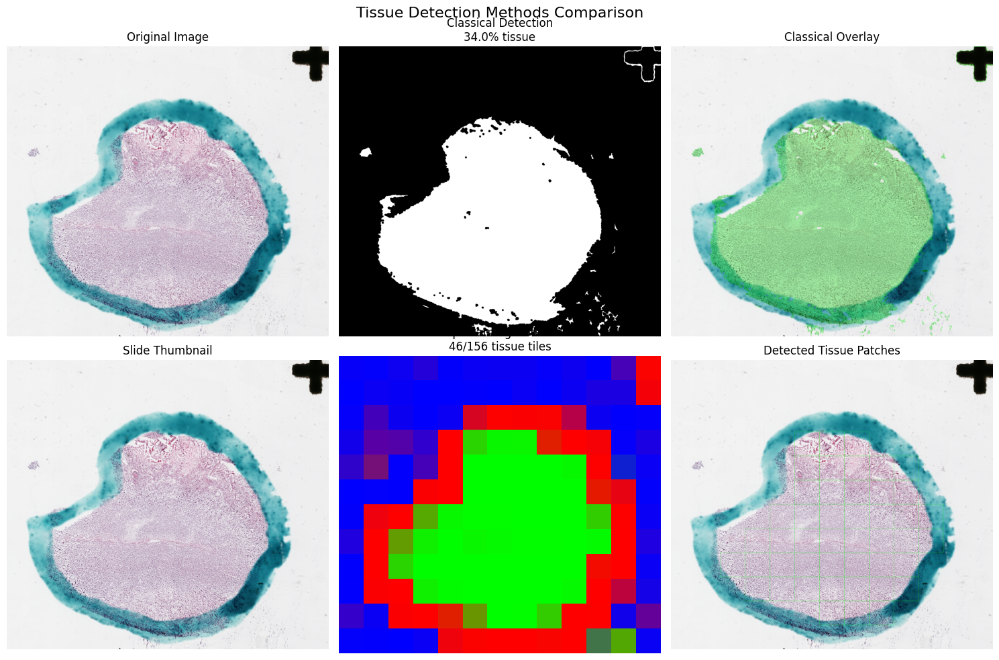


Performance Comparison:
  Classical method: 0.20s
  Deep learning: 1.12s


In [14]:
# Compare detection methods visually
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Tissue Detection Methods Comparison', fontsize=16)

# Row 1: Classical method
axes[0, 0].imshow(low_res_image)
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(classical_mask, cmap='gray')
axes[0, 1].set_title(f'Classical Detection\n{tissue_percentage:.1f}% tissue')
axes[0, 1].axis('off')

# Overlay
overlay = low_res_image.copy()
overlay[classical_mask] = overlay[classical_mask] * 0.7 + np.array([0, 255, 0]) * 0.3
axes[0, 2].imshow(overlay.astype(np.uint8))
axes[0, 2].set_title('Classical Overlay')
axes[0, 2].axis('off')

# Row 2: Deep learning method
# Create visualization of tile classifications
prediction_map = np.zeros((slide_with_detection.numTilesInY, 
                          slide_with_detection.numTilesInX, 3))

for address in slide_with_detection.iterateTiles():
    tile_info = slide_with_detection.tileDictionary[address]
    if 'tissueLevel' in tile_info:
        # Color code: Red=Artifact, Blue=Background, Green=Tissue
        prediction_map[address[1], address[0], 0] = tile_info.get('artifactLevel', 0)
        prediction_map[address[1], address[0], 1] = tile_info.get('tissueLevel', 0)
        prediction_map[address[1], address[0], 2] = tile_info.get('backgroundLevel', 0)

# Get slide thumbnail
slide_thumb = np.asarray(slide_with_detection.slide)

axes[1, 0].imshow(slide_thumb)
axes[1, 0].set_title('Slide Thumbnail')
axes[1, 0].axis('off')

axes[1, 1].imshow(prediction_map)
axes[1, 1].set_title(f'Deep Learning Detection\n{tissue_tiles}/{total_tiles} tissue tiles')
axes[1, 1].axis('off')

# Show patch grid
grid_vis = slide_thumb.copy()
scale_y = slide_thumb.shape[0] / slide_with_detection.numTilesInY
scale_x = slide_thumb.shape[1] / slide_with_detection.numTilesInX

for address in slide_with_detection.iterateTiles():
    tile_info = slide_with_detection.tileDictionary[address]
    if tile_info.get('tissueLevel', 0) >= tissue_confidence_threshold:
        y = int(address[1] * scale_y)
        x = int(address[0] * scale_x)
        h = int(scale_y)
        w = int(scale_x)
        cv2.rectangle(grid_vis, (x, y), (x+w, y+h), (0, 255, 0), 2)

axes[1, 2].imshow(grid_vis)
axes[1, 2].set_title('Detected Tissue Patches')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

# Performance comparison
print(f"\nPerformance Comparison:")
print(f"  Classical method: {classical_time:.2f}s")
print(f"  Deep learning: {deep_time:.2f}s")

# Part 3: Stain Normalization

Stain normalization addresses the significant color variations that occur in histopathology images due to:
- Different staining protocols
- Variations in stain concentration
- Scanner differences
- Tissue processing variations

We'll demonstrate three popular normalization methods:
1. **Reinhard**: Statistical color transfer in LAB color space
2. **Macenko**: Stain vector estimation using SVD
3. **Vahadane**: Sparse non-negative matrix factorization

In [15]:
# Extract tissue patches for normalization
def extract_tissue_patches(slide, n_patches=10, patch_size=512):
    """Extract patches with high tissue content."""
    patches = []
    
    # Try using load_patches_concurrently if available
    if hasattr(slide, 'load_patches_concurrently'):
        try:
            all_patches = slide.load_patches_concurrently(target_patch_size=224)
            print(f"Loaded {all_patches.shape[0]} tissue patches")
            
            # Resize to requested size
            from skimage.transform import resize
            for i in range(min(n_patches, all_patches.shape[0])):
                patch = all_patches[i]
                if patch.shape[0] != patch_size:
                    patch = resize(patch, (patch_size, patch_size, 3), 
                                 preserve_range=True).astype(np.uint8)
                patches.append(patch)
            return patches
        except Exception as e:
            print(f"Concurrent loading failed: {e}")
    
    # Manual extraction fallback
    tissue_tiles = []
    for address in slide.iterateTiles():
        tile_info = slide.tileDictionary[address]
        if tile_info.get('tissueLevel', 0) > 0.8:
            tissue_tiles.append((address, tile_info))
    
    # Extract patches
    for i, (addr, info) in enumerate(tissue_tiles[:n_patches]):
        region = slide.img.read_region(
            [info['x'], info['y']], 
            [patch_size, patch_size], 
            slide.selected_level
        )
        patches.append(np.asarray(region)[:, :, :3])
    
    return patches

# Extract patches
print("Extracting tissue patches for normalization...")
patches = extract_tissue_patches(slide_with_detection, n_patches=15, patch_size=512)
print(f"Extracted {len(patches)} patches")

Extracting tissue patches for normalization...
Loaded 46 tissue patches
Extracted 15 patches


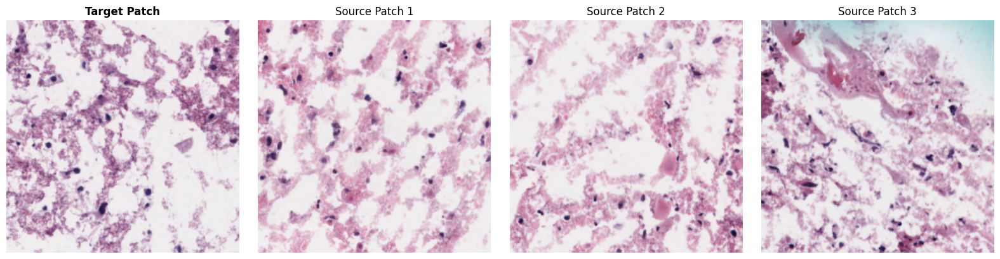

In [19]:
# Select target and source patches
target_patch = patches[9]  # Use first patch as normalization target
source_patches = patches[5:8]  # Use different patches as sources

# Display patches
fig, axes = plt.subplots(1, 4, figsize=(16, 4))
axes[0].imshow(target_patch)
axes[0].set_title('Target Patch', fontsize=12, fontweight='bold')
axes[0].axis('off')

for i, patch in enumerate(source_patches):
    axes[i+1].imshow(patch)
    axes[i+1].set_title(f'Source Patch {i+1}')
    axes[i+1].axis('off')

plt.tight_layout()
plt.show()

In [20]:
# Perform stain normalization with all three methods
print("Performing stain normalization...\n")

# Initialize normalizers
reinhard_normalizer = ReinhardNormalizer()
macenko_normalizer = MacenkoNormalizer()
vahadane_normalizer = VahadaneNormalizer()

# Fit normalizers to target
reinhard_normalizer.fit(target_patch)
macenko_normalizer.fit(target_patch)
vahadane_normalizer.fit(target_patch)

# Normalize each source patch
results = []

for i, source in enumerate(source_patches):
    print(f"Normalizing patch {i+1}...")
    
    # Time each method
    start = time.time()
    reinhard_norm = reinhard_normalizer.transform(source)
    reinhard_time = time.time() - start
    
    start = time.time()
    try:
        macenko_norm = macenko_normalizer.transform(source)
    except:
        macenko_norm = source  # Fallback if fails
    macenko_time = time.time() - start
    
    start = time.time()
    try:
        vahadane_norm = vahadane_normalizer.transform(source)
    except:
        vahadane_norm = source  # Fallback if fails
    vahadane_time = time.time() - start
    
    results.append({
        'original': source,
        'reinhard': reinhard_norm,
        'macenko': macenko_norm,
        'vahadane': vahadane_norm,
        'times': (reinhard_time, macenko_time, vahadane_time)
    })
    
    print(f"  Reinhard: {reinhard_time:.3f}s")
    print(f"  Macenko: {macenko_time:.3f}s")
    print(f"  Vahadane: {vahadane_time:.3f}s")

Performing stain normalization...

Normalizing patch 1...
  Reinhard: 0.012s
  Macenko: 0.029s
  Vahadane: 0.037s
Normalizing patch 2...
  Reinhard: 0.017s
  Macenko: 0.032s
  Vahadane: 0.034s
Normalizing patch 3...
  Reinhard: 0.015s
  Macenko: 0.020s
  Vahadane: 0.036s


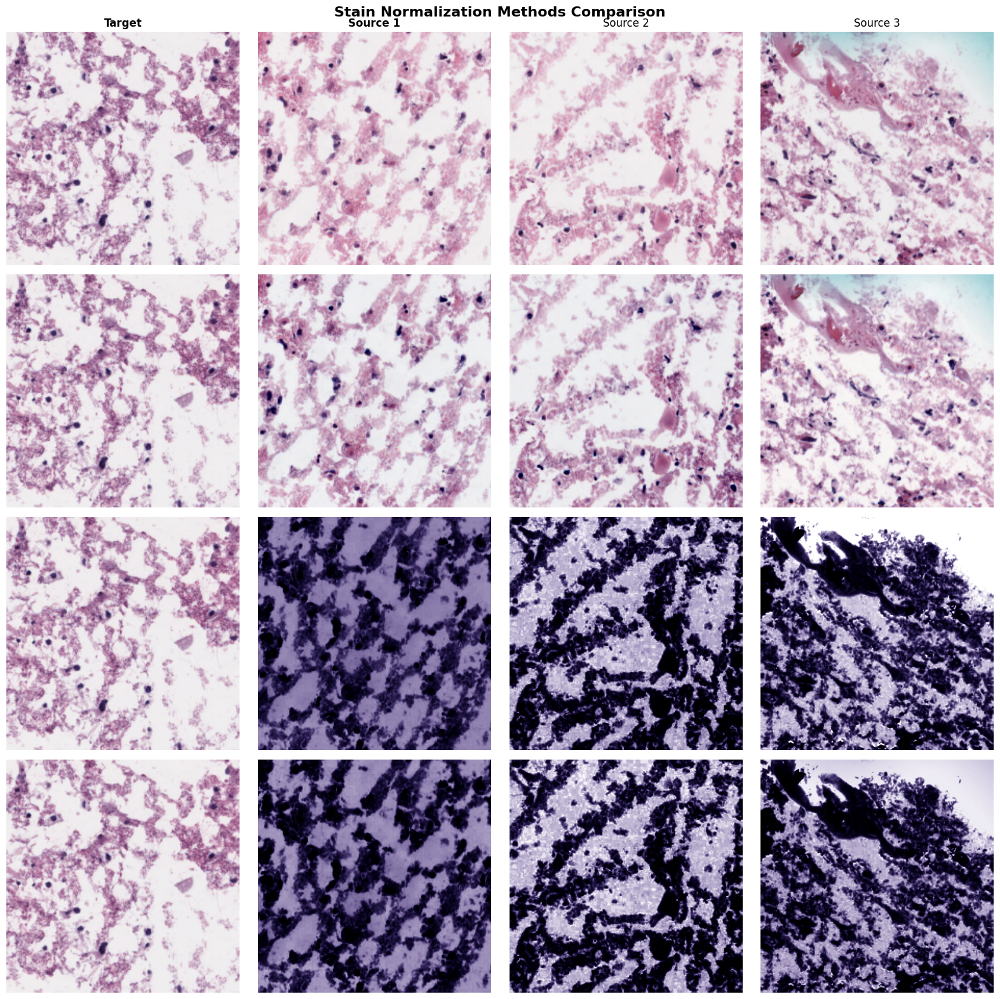


Average processing times:
  Reinhard: 0.015s (fastest)
  Macenko: 0.027s
  Vahadane: 0.036s (most robust)


In [21]:
# Visualize normalization results
fig, axes = plt.subplots(4, 4, figsize=(16, 16))
fig.suptitle('Stain Normalization Methods Comparison', fontsize=16, fontweight='bold')

# Row labels
row_labels = ['Original', 'Reinhard', 'Macenko', 'Vahadane']

# First column: target
for row in range(4):
    axes[row, 0].imshow(target_patch)
    if row == 0:
        axes[row, 0].set_title('Target', fontweight='bold')
    axes[row, 0].set_ylabel(row_labels[row], fontsize=12, fontweight='bold')
    axes[row, 0].axis('off')

# Remaining columns: source patches and normalizations
for col, result in enumerate(results):
    axes[0, col+1].imshow(result['original'])
    axes[1, col+1].imshow(result['reinhard'])
    axes[2, col+1].imshow(result['macenko'])
    axes[3, col+1].imshow(result['vahadane'])
    
    if col == 0:
        axes[0, col+1].set_title(f'Source {col+1}', fontweight='bold')
    else:
        axes[0, col+1].set_title(f'Source {col+1}')
    
    for row in range(4):
        axes[row, col+1].axis('off')

plt.tight_layout()
plt.show()

# Performance summary
print("\nAverage processing times:")
avg_times = np.mean([r['times'] for r in results], axis=0)
print(f"  Reinhard: {avg_times[0]:.3f}s (fastest)")
print(f"  Macenko: {avg_times[1]:.3f}s")
print(f"  Vahadane: {avg_times[2]:.3f}s (most robust)")


Demonstrating stain augmentation for model training...


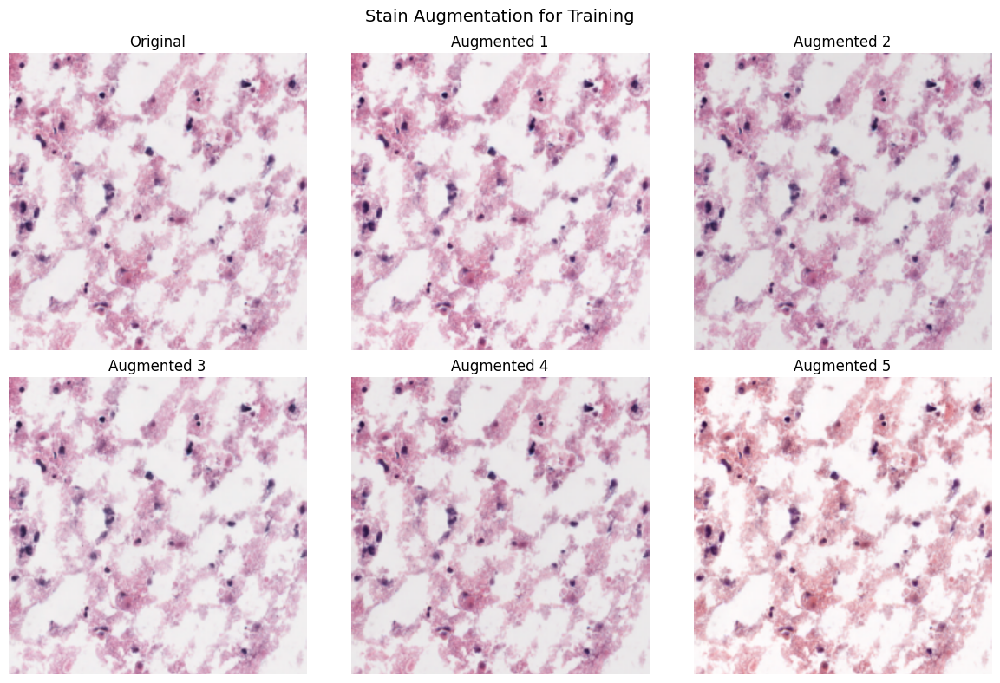

In [22]:
# Demonstrate color augmentation for training
print("\nDemonstrating stain augmentation for model training...")

# Create augmenter
augmenter = ColorAugmenter(
    hue_shift_range=(-0.05, 0.05),
    saturation_range=(0.9, 1.1),
    brightness_range=(0.95, 1.05),
    contrast_range=(0.95, 1.05)
)

# Generate augmented versions
original = source_patches[0]
augmented_versions = [original]  # Include original

for i in range(5):
    augmented = augmenter.augment(original, seed=i)
    augmented_versions.append(augmented)

# Display augmentations
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
fig.suptitle('Stain Augmentation for Training', fontsize=14)

for i, (ax, img) in enumerate(zip(axes.flat, augmented_versions)):
    ax.imshow(img)
    ax.set_title('Original' if i == 0 else f'Augmented {i}')
    ax.axis('off')

plt.tight_layout()
plt.show()

# Part 4: Stain Separation

Stain separation (color deconvolution) allows us to analyze individual stain contributions in H&E images:
- **Hematoxylin**: Stains cell nuclei (blue/purple)
- **Eosin**: Stains cytoplasm and extracellular matrix (pink)

This is useful for:
- Quantifying nuclear content
- Measuring staining intensity
- Feature extraction for machine learning
- Quality control

In [23]:
# Extract fresh patches specifically for stain separation
print("Extracting patches for stain separation analysis...")

# We want patches with good H&E staining
stain_patches = []
for patch in patches[:10]:
    # Quick check for H&E content
    hed = rgb2hed(patch)
    h_max = hed[:, :, 0].max()
    e_max = hed[:, :, 1].max()
    
    if h_max > 0.15 and e_max > 0.01:  # Both stains present
        stain_patches.append(patch)
        if len(stain_patches) >= 5:
            break

print(f"Found {len(stain_patches)} patches with good H&E staining")

# Select best patch for demonstration
test_patch = stain_patches[0] if stain_patches else patches[0]
print(f"Test patch shape: {test_patch.shape}")

Extracting patches for stain separation analysis...
Found 5 patches with good H&E staining
Test patch shape: (512, 512, 3)


In [24]:
# Perform stain separation
print("Performing H&E stain separation...")

# Convert to HED color space
hed = rgb2hed(test_patch)

# Separate channels
h_channel = hed[:, :, 0]  # Hematoxylin
e_channel = hed[:, :, 1]  # Eosin
d_channel = hed[:, :, 2]  # DAB (not used in H&E)

print(f"\nChannel statistics:")
print(f"  Hematoxylin: min={h_channel.min():.3f}, max={h_channel.max():.3f}, mean={h_channel.mean():.3f}")
print(f"  Eosin: min={e_channel.min():.3f}, max={e_channel.max():.3f}, mean={e_channel.mean():.3f}")
print(f"  DAB: min={d_channel.min():.3f}, max={d_channel.max():.3f}, mean={d_channel.mean():.3f}")

Performing H&E stain separation...

Channel statistics:
  Hematoxylin: min=0.000, max=0.287, mean=0.050
  Eosin: min=0.000, max=0.063, mean=0.005
  DAB: min=0.000, max=0.133, mean=0.014


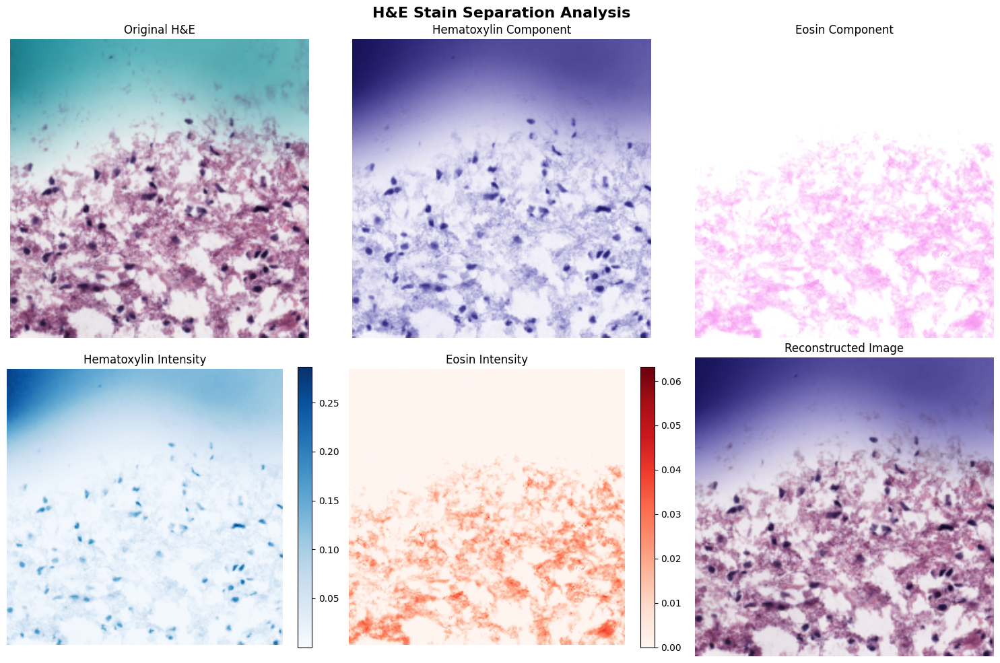


Reconstruction quality: PSNR = 19.18 dB


In [25]:
# Visualize individual stain components
def create_single_stain_image(channel, channel_idx):
    """Create RGB visualization of a single stain."""
    hed_single = np.zeros((*channel.shape, 3))
    hed_single[:, :, channel_idx] = channel
    return hed2rgb(hed_single)

# Create visualizations
h_rgb = create_single_stain_image(h_channel, 0)
e_rgb = create_single_stain_image(e_channel, 1)
d_rgb = create_single_stain_image(d_channel, 2)

# Display results
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('H&E Stain Separation Analysis', fontsize=16, fontweight='bold')

# Row 1: Color images
axes[0, 0].imshow(test_patch)
axes[0, 0].set_title('Original H&E')
axes[0, 0].axis('off')

axes[0, 1].imshow(h_rgb)
axes[0, 1].set_title('Hematoxylin Component')
axes[0, 1].axis('off')

axes[0, 2].imshow(e_rgb)
axes[0, 2].set_title('Eosin Component')
axes[0, 2].axis('off')

# Row 2: Grayscale intensity maps
im1 = axes[1, 0].imshow(h_channel, cmap='Blues')
axes[1, 0].set_title('Hematoxylin Intensity')
axes[1, 0].axis('off')
plt.colorbar(im1, ax=axes[1, 0], fraction=0.046)

im2 = axes[1, 1].imshow(e_channel, cmap='Reds')
axes[1, 1].set_title('Eosin Intensity')
axes[1, 1].axis('off')
plt.colorbar(im2, ax=axes[1, 1], fraction=0.046)

# Reconstruction
reconstructed = hed2rgb(hed)
axes[1, 2].imshow(reconstructed)
axes[1, 2].set_title('Reconstructed Image')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

# Calculate reconstruction error
mse = np.mean((test_patch.astype(float) - reconstructed * 255)**2)
psnr = 20 * np.log10(255.0 / np.sqrt(mse))
print(f"\nReconstruction quality: PSNR = {psnr:.2f} dB")


Analyzing stain statistics across tissue patches...


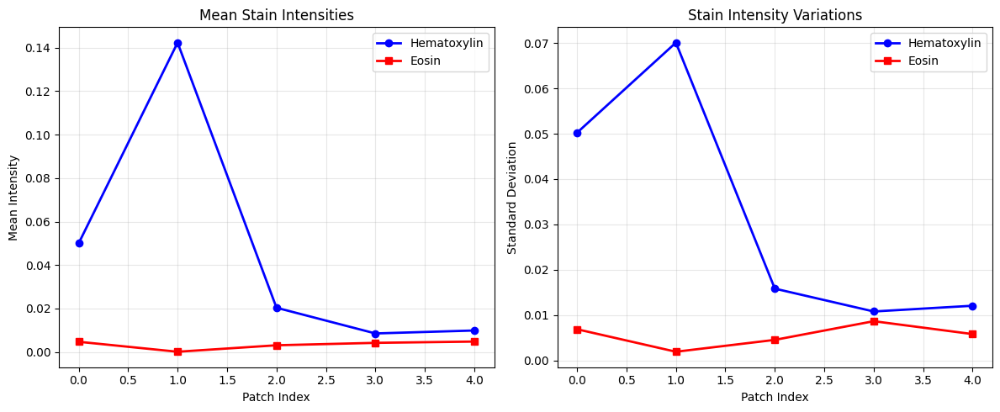


Across 5 patches:
  Hematoxylin: 0.046 ± 0.050
  Eosin: 0.003 ± 0.002


In [26]:
# Analyze stain statistics across multiple patches
print("\nAnalyzing stain statistics across tissue patches...")

h_means = []
e_means = []
h_stds = []
e_stds = []

for i, patch in enumerate(stain_patches[:5]):
    hed = rgb2hed(patch)
    h = hed[:, :, 0]
    e = hed[:, :, 1]
    
    h_means.append(h.mean())
    e_means.append(e.mean())
    h_stds.append(h.std())
    e_stds.append(e.std())

# Plot statistics
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Means
x = range(len(h_means))
axes[0].plot(x, h_means, 'b-o', label='Hematoxylin', linewidth=2)
axes[0].plot(x, e_means, 'r-s', label='Eosin', linewidth=2)
axes[0].set_xlabel('Patch Index')
axes[0].set_ylabel('Mean Intensity')
axes[0].set_title('Mean Stain Intensities')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Standard deviations
axes[1].plot(x, h_stds, 'b-o', label='Hematoxylin', linewidth=2)
axes[1].plot(x, e_stds, 'r-s', label='Eosin', linewidth=2)
axes[1].set_xlabel('Patch Index')
axes[1].set_ylabel('Standard Deviation')
axes[1].set_title('Stain Intensity Variations')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\nAcross {len(h_means)} patches:")
print(f"  Hematoxylin: {np.mean(h_means):.3f} ± {np.std(h_means):.3f}")
print(f"  Eosin: {np.mean(e_means):.3f} ± {np.std(e_means):.3f}")


Demonstrating stain intensity modifications...


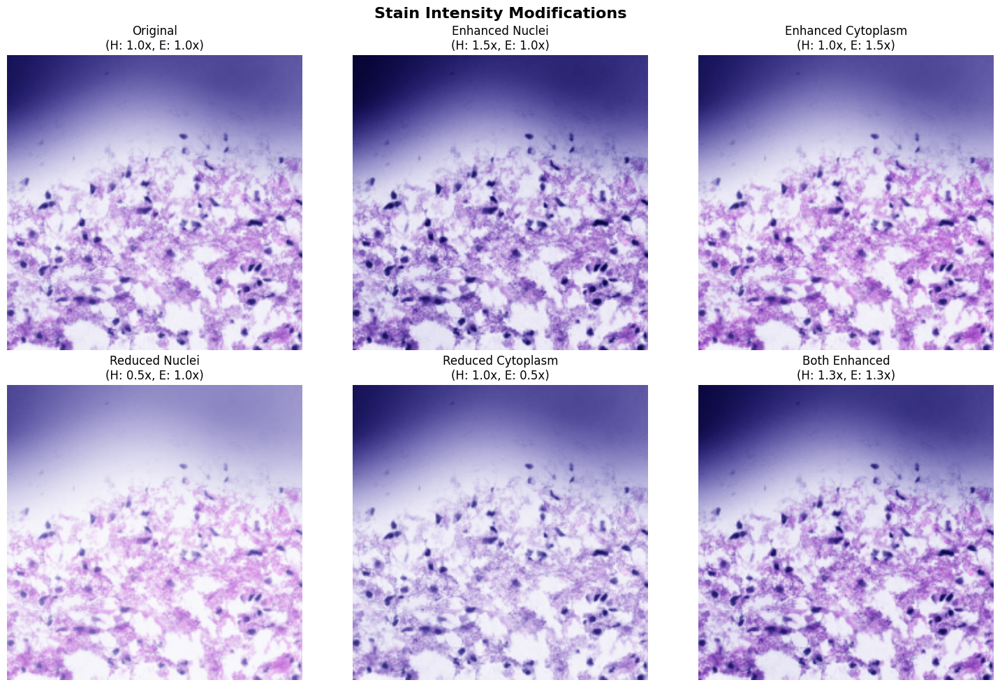

In [27]:
# Demonstrate stain modification
print("\nDemonstrating stain intensity modifications...")

# Modify stain intensities
modifications = [
    ("Original", 1.0, 1.0),
    ("Enhanced Nuclei", 1.5, 1.0),
    ("Enhanced Cytoplasm", 1.0, 1.5),
    ("Reduced Nuclei", 0.5, 1.0),
    ("Reduced Cytoplasm", 1.0, 0.5),
    ("Both Enhanced", 1.3, 1.3)
]

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Stain Intensity Modifications', fontsize=16, fontweight='bold')

for idx, (name, h_factor, e_factor) in enumerate(modifications):
    row = idx // 3
    col = idx % 3
    
    # Modify channels
    h_modified = h_channel * h_factor
    e_modified = e_channel * e_factor
    
    # Reconstruct
    hed_modified = np.stack([h_modified, e_modified, d_channel * 0], axis=-1)
    rgb_modified = hed2rgb(hed_modified)
    
    axes[row, col].imshow(rgb_modified)
    axes[row, col].set_title(f'{name}\n(H: {h_factor}x, E: {e_factor}x)')
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

# Summary and Best Practices

## Key Takeaways

### 1. WSI Loading
- Always use appropriate pyramid levels for your task
- Level 0 is full resolution but memory-intensive
- Higher levels are faster but lower resolution
- Read only the regions you need

### 2. Tissue Detection
- **Classical methods** are fast but less accurate
- **Deep learning** is more accurate but slower
- Consider tissue confidence thresholds based on your application
- Filter patches by tissue content to improve downstream analysis

### 3. Stain Normalization
- **Reinhard**: Fastest, good for real-time applications
- **Macenko**: Balance of speed and quality
- **Vahadane**: Most robust but slowest
- Always normalize to a consistent target
- Consider augmentation for training robustness

### 4. Stain Separation
- Useful for quantitative analysis
- Can improve feature extraction
- Allows stain-specific processing
- Check reconstruction quality

## Recommended Workflow

1. Load WSI at appropriate resolution
2. Perform tissue detection to identify regions of interest
3. Extract patches from tissue regions
4. Apply stain normalization for consistency
5. Use stain separation for specific analysis needs
6. Process normalized patches with your ML pipeline

In [28]:
# Save key results
print("Saving results...")

# Create results summary
results_summary = {
    "wsi_path": WSI_PATH,
    "wsi_properties": {
        "dimensions": resolutions['level_dimensions'][0],
        "pyramid_levels": resolutions['level_count'],
        "file_size_gb": os.path.getsize(WSI_PATH) / (1024**3)
    },
    "tissue_detection": {
        "classical_tissue_percent": tissue_percentage,
        "deep_learning_tissue_tiles": tissue_tiles,
        "total_tiles": total_tiles
    },
    "normalization_times": {
        "reinhard": float(avg_times[0]),
        "macenko": float(avg_times[1]),
        "vahadane": float(avg_times[2])
    },
    "stain_statistics": {
        "hematoxylin_mean": float(np.mean(h_means)),
        "eosin_mean": float(np.mean(e_means))
    }
}

# Save summary
summary_path = os.path.join(OUTPUT_DIR, "wsi_analysis_summary.json")
with open(summary_path, 'w') as f:
    json.dump(results_summary, f, indent=2)

print(f"\nResults saved to: {OUTPUT_DIR}")
print(f"Summary: {summary_path}")
print("\nTutorial completed successfully!")

Saving results...

Results saved to: ./wsi_tutorial_outputs
Summary: ./wsi_tutorial_outputs/wsi_analysis_summary.json

Tutorial completed successfully!
